In [3]:
from functions import *

In [4]:
psl_all = xr.open_dataset(atm_dir_20 + 'test_LGM_oldtopo.cam.h0.PSL.000101-002012.nc')['PSL']
smb_all = xr.open_dataset(lnd_dir_20 + 'test_LGM_oldtopo.clm2.h0.QICE.000101-002012.nc')["QICE"]
qice_melt_all = xr.open_dataset(lnd_dir_20 + 'test_LGM_oldtopo.clm2.h0.QICE_MELT.000101-002012.nc')["QICE_MELT"]

In [5]:
qs = xr.open_dataset(lnd_dir_20 + 'test_LGM_oldtopo.clm2.h0.QSNWCPICE.000101-002012.nc')["QSNWCPICE"]

In [ ]:
print("______________")
print("PROCESSING DATA")
smb_total = xr.DataArray(smb_all + qice_melt_all)
smb_processed = preprocess_laurentide(smb_total)
print("______________")
print("CONVERTING TO 2D")
smb_X_dimensional, smb_im, smb_jm, smb_long_length, smb_lat_length = nans_3d_to_2d(smb_processed)
print("______________")
print("DOING PCA")
smb_eigenvalues, smb_V, smb_X = pca(smb_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb = plot_eigen(smb_eigenvalues, "QICE (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb_V, smb_X, 4, "TIME SERIES OF PCA OF QICE + QICE_MELT", perc_smb)
print("______________")
print("PLOTTING PCs")
smb_PCAs = nans_2d_to_3d(smb_V, smb_long_length, smb_lat_length, smb_im, smb_jm)
data_smb ={
    'reshaped_pca': smb_PCAs,
    'original': smb_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        2: .15,
        3: .2
    },
    'perc': perc_smb
}

plot_pcs(data_smb, 4, "PCA OF QICE (SMB) OF QICE + QICE_MELT")

______________
PROCESSING DATA
converting data to m/s
deseasonalizing data
slicing data
______________
CONVERTING TO 2D
time 240 lat 64 long 101
finished finding nans
total nans 4061
up through 0


In [14]:
july_data = smb_all.sel(time=smb_all.time.dt.month == 7)
july_index = july_data.time[0]
july_index

<xarray.DataArray 'time' ()> Size: 8B
array(cftime.DatetimeNoLeap(1, 7, 1, 0, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time     object 8B 0001-07-01 00:00:00
Attributes:
    long_name:  time
    bounds:     time_bounds

In [9]:
smb_all

<xarray.DataArray 'QICE' (time: 240, lat: 192, lon: 288)> Size: 53MB
array([[[2.237602e-06, 2.237602e-06, ..., 2.237838e-06, 2.237838e-06],
        [2.933935e-06, 2.936846e-06, ..., 2.945816e-06, 2.941624e-06],
        ...,
        [         nan,          nan, ...,          nan,          nan],
        [         nan,          nan, ...,          nan,          nan]],

       [[7.145297e-07, 7.145297e-07, ..., 7.145408e-07, 7.145408e-07],
        [5.444761e-07, 5.457871e-07, ..., 5.442623e-07, 5.445153e-07],
        ...,
        [         nan,          nan, ...,          nan,          nan],
        [         nan,          nan, ...,          nan,          nan]],

       ...,

       [[4.749686e-07, 4.749686e-07, ..., 4.749746e-07, 4.749746e-07],
        [7.512980e-07, 7.554979e-07, ..., 7.441975e-07, 7.487034e-07],
        ...,
        [         nan,          nan, ...,          nan,          nan],
        [         nan,          nan, ...,          nan,          nan]],

       [[5.642528e-07, 5.642528e-07, ..., 5.642722e-07, 5.642722e-07],
        [6.259709e-07, 6.227785e-07, ..., 6.311858e-07, 6.281153e-07],
        ...,
        [         nan,          nan, ...,          nan,          nan],
        [         nan,          nan, ...,          nan,          nan]]],
      dtype=float32)
Coordinates:
  * lon      (lon) float32 1kB 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 768B -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * time     (time) object 2kB 0001-02-01 00:00:00 ... 0021-01-01 00:00:00
Attributes:
    long_name:     ice growth/melt
    units:         mm/s
    cell_methods:  time: mean

converting data to m/s
slicing data
converting data to m/s
slicing data
converting data to m/s
slicing data
converting data to m/s
slicing data


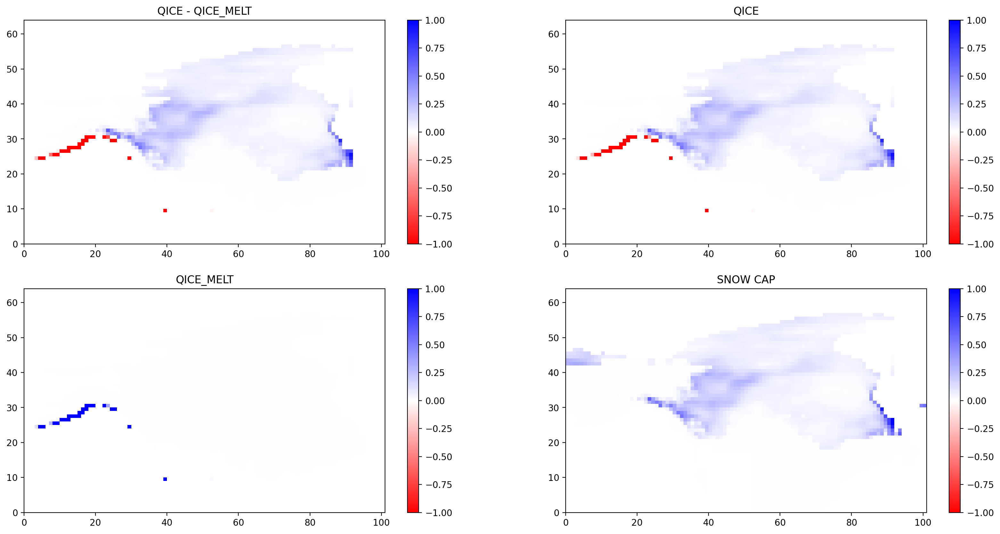

In [6]:
fig, axs = plt.subplots(2, 2, figsize=(20,10), dpi=200)
ax = axs.flatten()
cmesh = ax[0].pcolormesh(preprocess_laurentide( xr.DataArray(smb_all - qice_melt_all))[0],vmin=-1,vmax=1,cmap='bwr_r')
ax[0].set_title('QICE - QICE_MELT')
fig.colorbar(cmesh, ax=ax[0]) 

cmesh1 = ax[1].pcolormesh(preprocess_laurentide(smb_all)[0],vmin=-1,vmax=1,cmap='bwr_r')
ax[1].set_title('QICE')
fig.colorbar(cmesh1, ax=ax[1]) 

cmesh2 = ax[2].pcolormesh(preprocess_laurentide(qice_melt_all)[0],vmin=-1,vmax=1,cmap='bwr_r')
ax[2].set_title('QICE_MELT')
fig.colorbar(cmesh2, ax=ax[2]) 

cmesh3 = ax[3].pcolormesh(preprocess_laurentide(qs)[0],vmin=-1,vmax=1,cmap='bwr_r')
ax[3].set_title('SNOW CAP')
fig.colorbar(cmesh3, ax=ax[3]) 

DOING PCA
covariance matrix shape (2403, 2403)
we calculated the first  10  evals
______________
PLOTTING EVALS


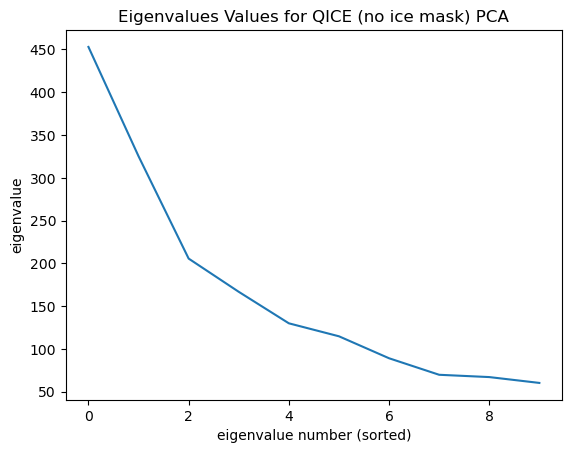

1 variance explained: 26.93%
2 variance explained: 19.34%
3 variance explained: 12.23%
4 variance explained: 9.92%
______________
PLOTTING TIME


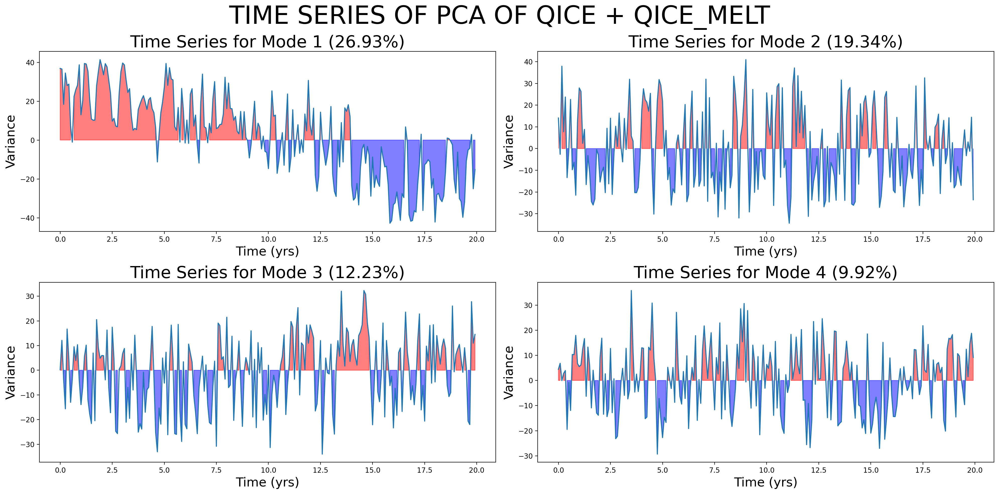

______________
PLOTTING PCs


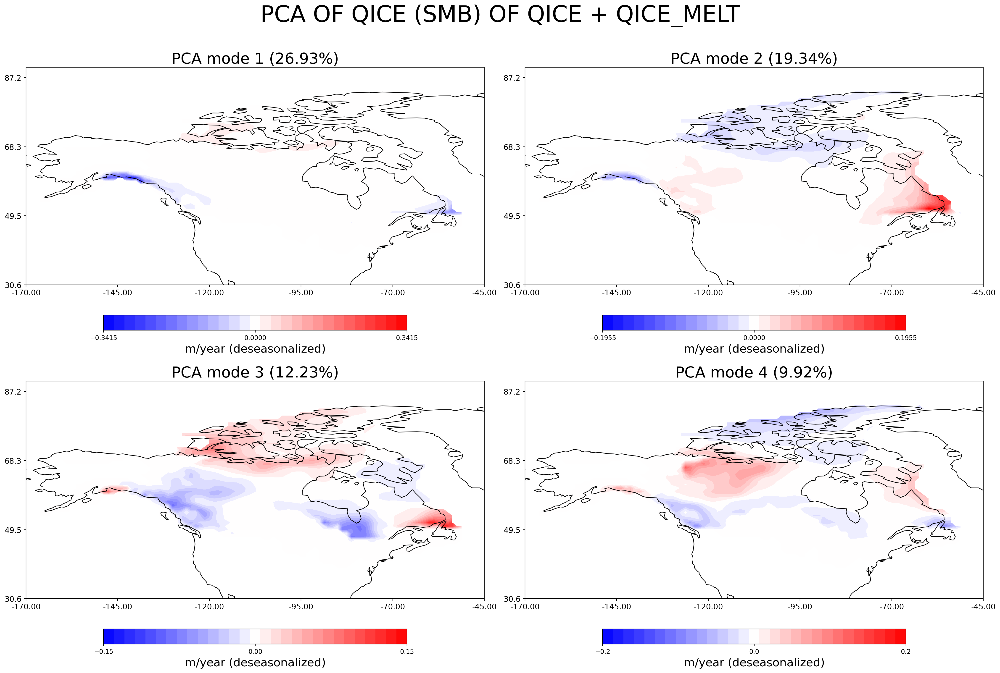

In [5]:
print("DOING PCA")
smb_eigenvalues, smb_V, smb_X = pca(xr.DataArray(smb_X_dimensional), 10)
print("______________")
print("PLOTTING EVALS")
perc_smb = plot_eigen(smb_eigenvalues, "QICE (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb_V, smb_X, 4, "TIME SERIES OF PCA OF QICE + QICE_MELT", perc_smb)
print("______________")
print("PLOTTING PCs")
smb_PCAs = nans_2d_to_3d(smb_V, smb_long_length, smb_lat_length, smb_im, smb_jm)
data_smb ={
    'reshaped_pca': smb_PCAs,
    'original': smb_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        2: .15,
        3: .2
    },
    'perc': perc_smb
}

plot_pcs(data_smb, 4, "PCA OF QICE (SMB) OF QICE + QICE_MELT")

# PSL

In [5]:
psl_all

<xarray.DataArray 'PSL' (time: 240, lat: 192, lon: 288)> Size: 53MB
[13271040 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon      (lon) float64 2kB 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time     (time) object 2kB 0001-02-01 00:00:00 ... 0021-01-01 00:00:00
Attributes:
    units:         Pa
    long_name:     Sea level pressure
    cell_methods:  time: mean

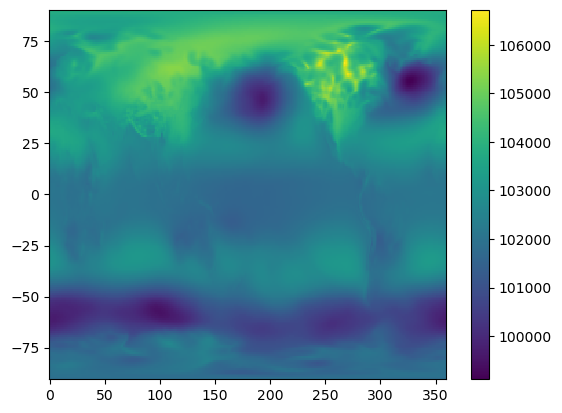

In [5]:
plt.pcolormesh(psl_all.lon, psl_all.lat, psl_all[0])
plt.colorbar()

## NAO (PCA of PSL in Ocean)

______________
PROCESSING DATA
converting to hecta pascals
confirming the shape is still the same (original, new) (240, 192, 288) (240, 192, 288)
slicing along lat=(20,80) and long=(-90,40)
______________
CONVERTING TO 2D
time 240 lat 64 long 105
______________
DOING PCA
covariance matrix shape (6720, 6720)
we calculated the first  10  evals
______________
PLOTTING EVALS


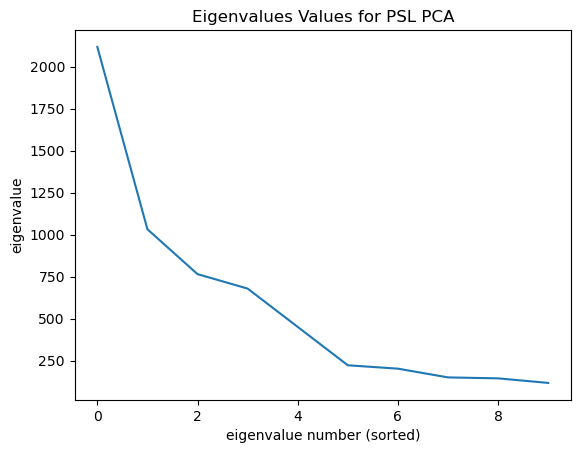

1 variance explained: 35.97%
2 variance explained: 17.54%
3 variance explained: 13.0%
4 variance explained: 11.54%
______________
PLOTTING TIME


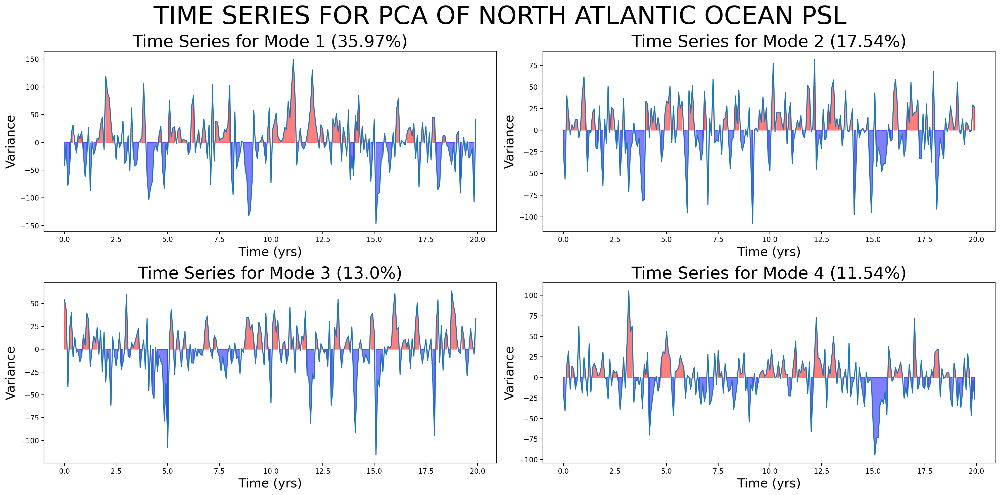

______________
PLOTTING PCs


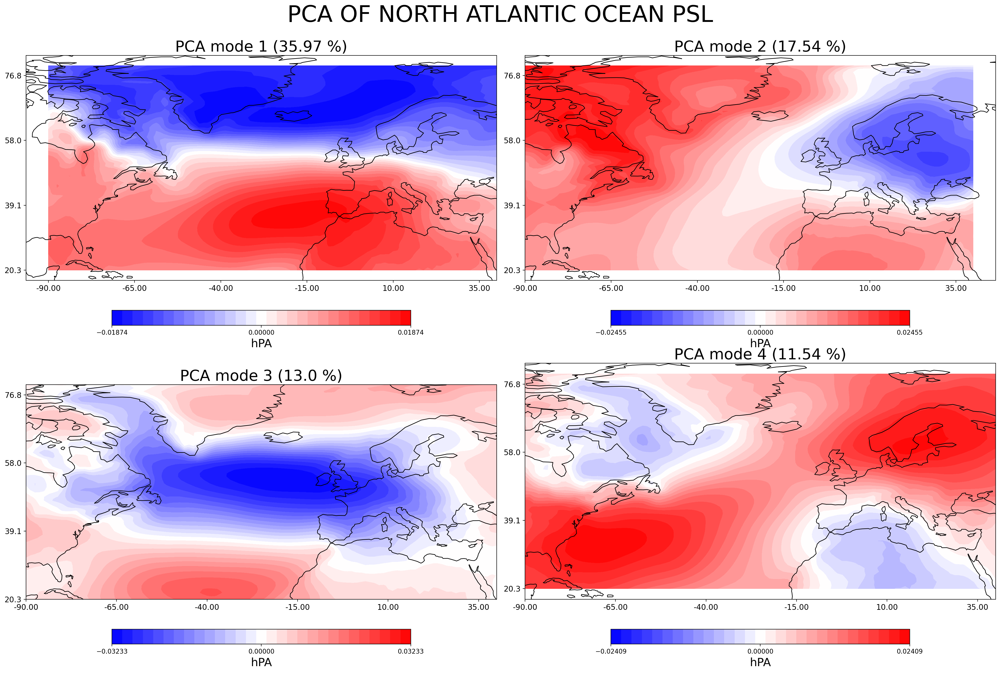

In [6]:
print("______________")
print("PROCESSING DATA")
north_atlantic_ocean_psl = preprocess_na_ocean(psl_all)
print("______________")
print("CONVERTING TO 2D")
time_length, lat_length, long_length = get_lengths(north_atlantic_ocean_psl)
X_dimensional = north_atlantic_ocean_psl.values.reshape(time_length, lat_length * long_length)
print("______________")
print("DOING PCA")
X = standardize(X_dimensional)
X = X.T
eigenvalues, V, X = pca(X, 10, False)
print("______________")
print("PLOTTING EVALS")
perc_psl = plot_eigen(eigenvalues, "PSL")
print("______________")
print("PLOTTING TIME")
plot_time_series(V, X, 4, "TIME SERIES FOR PCA OF NORTH ATLANTIC OCEAN PSL", perc_psl)
print("______________")
print("PLOTTING PCs")
PCs_reshaped = V.reshape(lat_length,long_length, 10)
data_psl ={
    'reshaped_pca': PCs_reshaped,
    'original': north_atlantic_ocean_psl,
    'label': "hPA",
    'shift': 0,
    'l_override': {},
    'perc': perc_psl
}

plot_pcs(data_psl, 4, "PCA OF NORTH ATLANTIC OCEAN PSL")

# SMB

In [8]:
smb_all

<xarray.DataArray 'QICE' (time: 240, lat: 192, lon: 288)> Size: 53MB
[13271040 values with dtype=float32]
Coordinates:
  * lon      (lon) float32 1kB 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 768B -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * time     (time) object 2kB 0001-02-01 00:00:00 ... 0021-01-01 00:00:00
Attributes:
    long_name:     ice growth/melt
    units:         mm/s
    cell_methods:  time: mean

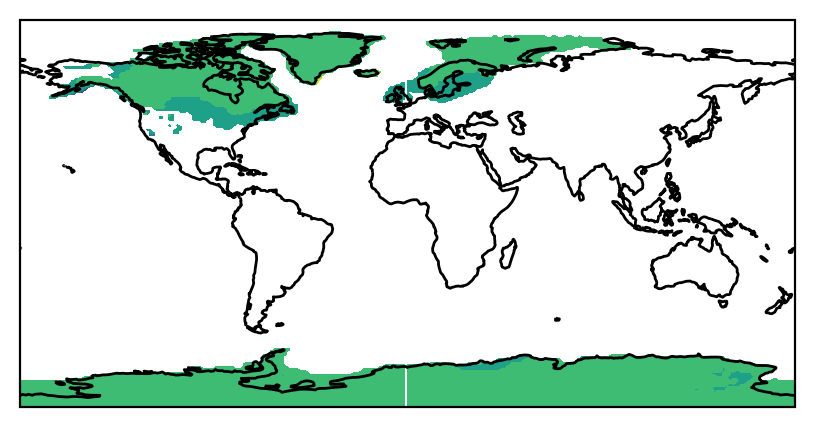

In [9]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(5, 5), dpi=200)
contour_plot = ax.contourf(smb_all.lon, smb_all.lat, smb_all[0])
ax.coastlines()
plt.show()

In [11]:
smb_processed = preprocess_laurentide(smb_all)

converting data to m/s
deseasonalizing data
slicing data


In [39]:
rocky_mask = xr.full_like(smb_processed, 1)
rocky_mask.loc[dict(lat=slice(30, 46), lon=slice(200, 260))] = np.nan
rocky_mask.loc[dict(lat=slice(30, 46), lon=slice(200, 260))]

In [40]:
new = smb_processed*rocky_mask

In [41]:
new.lon

<xarray.DataArray 'lon' (lon: 101)> Size: 404B
array([190.  , 191.25, 192.5 , 193.75, 195.  , 196.25, 197.5 , 198.75, 200.  ,
       201.25, 202.5 , 203.75, 205.  , 206.25, 207.5 , 208.75, 210.  , 211.25,
       212.5 , 213.75, 215.  , 216.25, 217.5 , 218.75, 220.  , 221.25, 222.5 ,
       223.75, 225.  , 226.25, 227.5 , 228.75, 230.  , 231.25, 232.5 , 233.75,
       235.  , 236.25, 237.5 , 238.75, 240.  , 241.25, 242.5 , 243.75, 245.  ,
       246.25, 247.5 , 248.75, 250.  , 251.25, 252.5 , 253.75, 255.  , 256.25,
       257.5 , 258.75, 260.  , 261.25, 262.5 , 263.75, 265.  , 266.25, 267.5 ,
       268.75, 270.  , 271.25, 272.5 , 273.75, 275.  , 276.25, 277.5 , 278.75,
       280.  , 281.25, 282.5 , 283.75, 285.  , 286.25, 287.5 , 288.75, 290.  ,
       291.25, 292.5 , 293.75, 295.  , 296.25, 297.5 , 298.75, 300.  , 301.25,
       302.5 , 303.75, 305.  , 306.25, 307.5 , 308.75, 310.  , 311.25, 312.5 ,
       313.75, 315.  ], dtype=float32)
Coordinates:
  * lon      (lon) float32 404B 190.0 191.2 192.5 193.8 ... 312.5 313.8 315.0
Attributes:
    long_name:  coordinate longitude
    units:      degrees_east

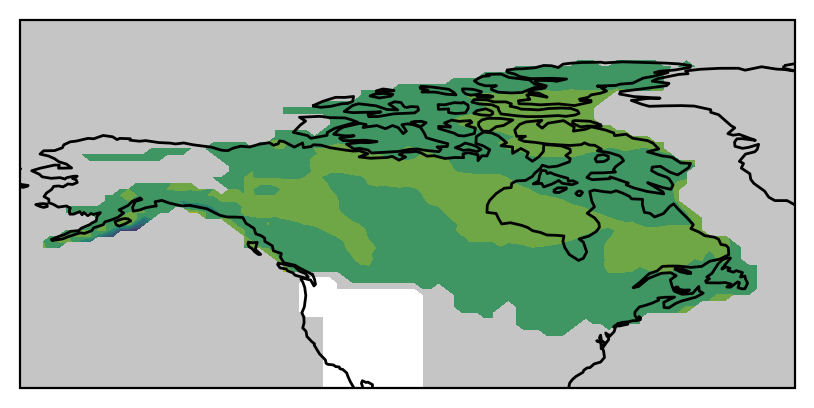

In [54]:
rocky_mask = xr.full_like(smb_processed, 1)
rocky_mask.loc[dict(lat=slice(30, 46), lon=slice(240, 254))] = np.nan
rocky_mask.loc[dict(lat=slice(42, 48), lon=slice(236, 241))] = np.nan
new = smb_processed*rocky_mask
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(5, 5), dpi=200)
contour_plot = ax.contourf(smb_processed.lon, smb_processed.lat, new[0])
mask_plot = ax.contourf(smb_processed.lon, smb_processed.lat, rocky_mask[0], cmap='gray', alpha=0.3)
ax.coastlines()
plt.show()

## SMB over Laurentide no Ice Mask

______________
PROCESSING DATA
converting data to m/s
deseasonalizing data
confirming the shape is still the same (original, new) (240, 192, 288) (240, 192, 288)
slicing data
______________
CONVERTING TO 2D
time 240 lat 64 long 101
finished finding nans
total nans 4014
up through 0
up through 50
up through 100
up through 150
up through 200
X shape (2450, 240)
______________
DOING PCA
covariance matrix shape (2450, 2450)
we calculated the first  10  evals
______________
PLOTTING EVALS


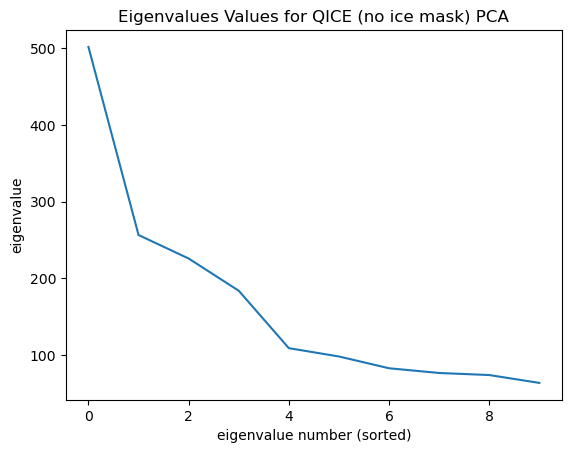

1 variance explained: 30.02%
2 variance explained: 15.34%
3 variance explained: 13.51%
4 variance explained: 11.0%
______________
PLOTTING TIME


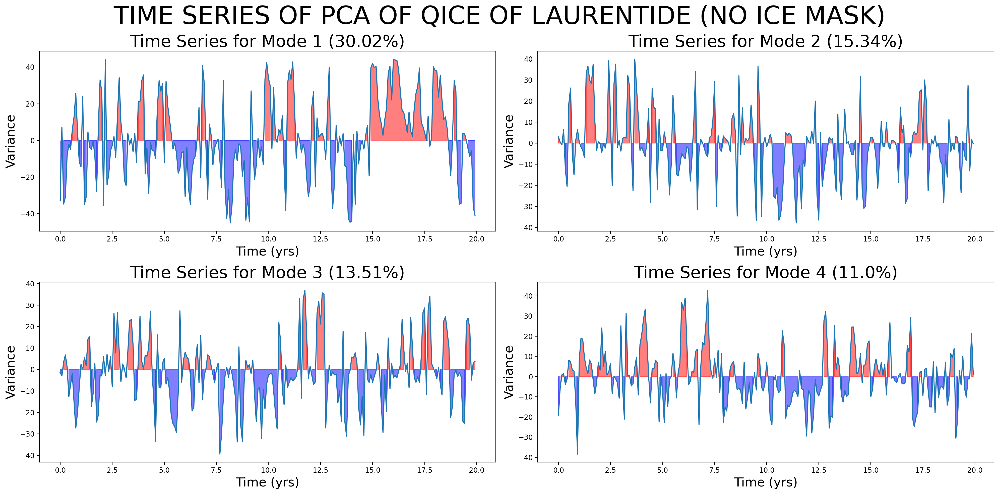

______________
PLOTTING PCs


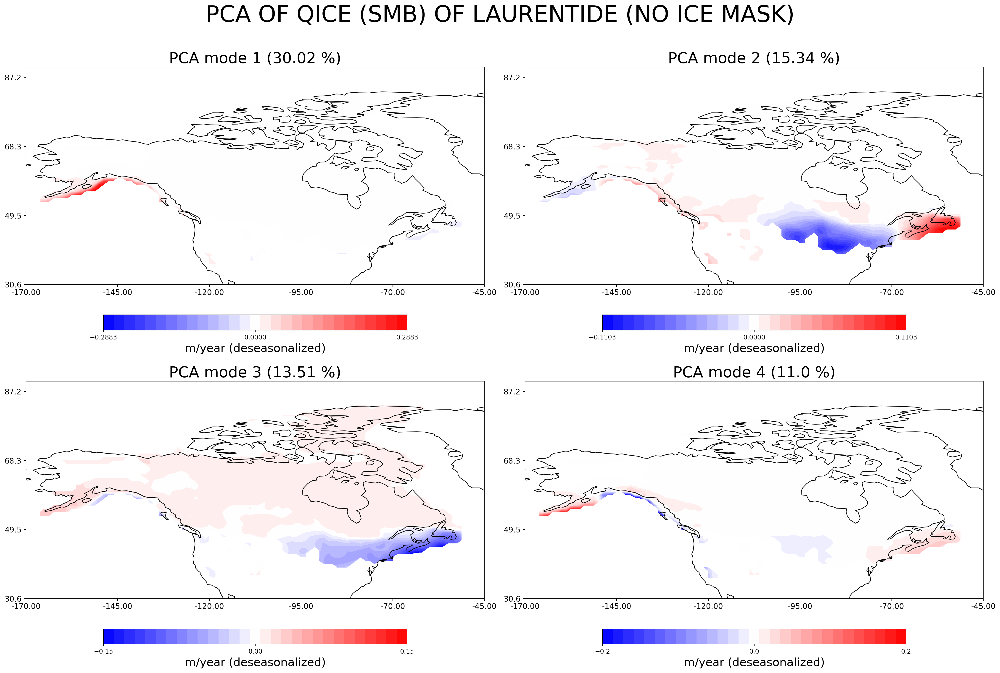

In [10]:
print("______________")
print("PROCESSING DATA")
smb_processed = preprocess_laurentide(smb_all)
print("______________")
print("CONVERTING TO 2D")
smb_X_dimensional, smb_im, smb_jm, smb_long_length, smb_lat_length = nans_3d_to_2d(smb_processed)
print("______________")
print("DOING PCA")
smb_eigenvalues, smb_V, smb_X = pca(smb_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb = plot_eigen(smb_eigenvalues, "QICE (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb_V, smb_X, 4, "TIME SERIES OF PCA OF QICE OF LAURENTIDE (NO ICE MASK)", perc_smb)
print("______________")
print("PLOTTING PCs")
smb_PCAs = nans_2d_to_3d(smb_V, smb_long_length, smb_lat_length, smb_im, smb_jm)
data_smb ={
    'reshaped_pca': smb_PCAs,
    'original': smb_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        2: .15,
        3: .2
    },
    'perc': perc_smb
}

plot_pcs(data_smb, 4, "PCA OF QICE (SMB) OF LAURENTIDE (NO ICE MASK)")

## SMB for Laurentide with 100% Ice only

______________
PROCESSING DATA
converting data to m/s
deseasonalizing data
confirming the shape is still the same (original, new) (240, 192, 288) (240, 192, 288)
adding ice mask
slicing data
______________
CONVERTING TO 2D
time 240 lat 64 long 101
finished finding nans
total nans 4577
up through 0
up through 50
up through 100
up through 150
up through 200
X shape (1887, 240)
______________
DOING PCA
covariance matrix shape (1887, 1887)
we calculated the first  10  evals
______________
PLOTTING EVALS


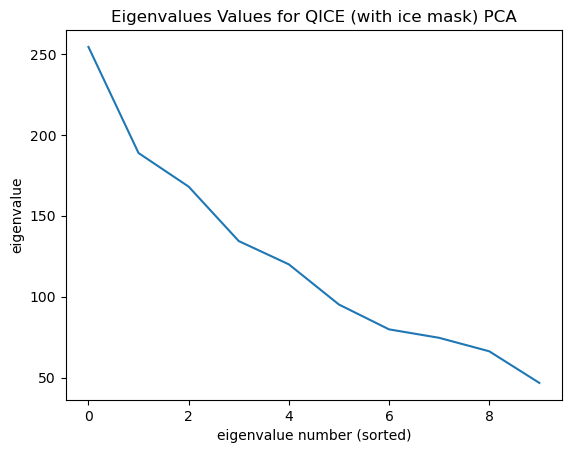

1 variance explained: 20.72%
2 variance explained: 15.37%
3 variance explained: 13.68%
4 variance explained: 10.94%
______________
PLOTTING TIME


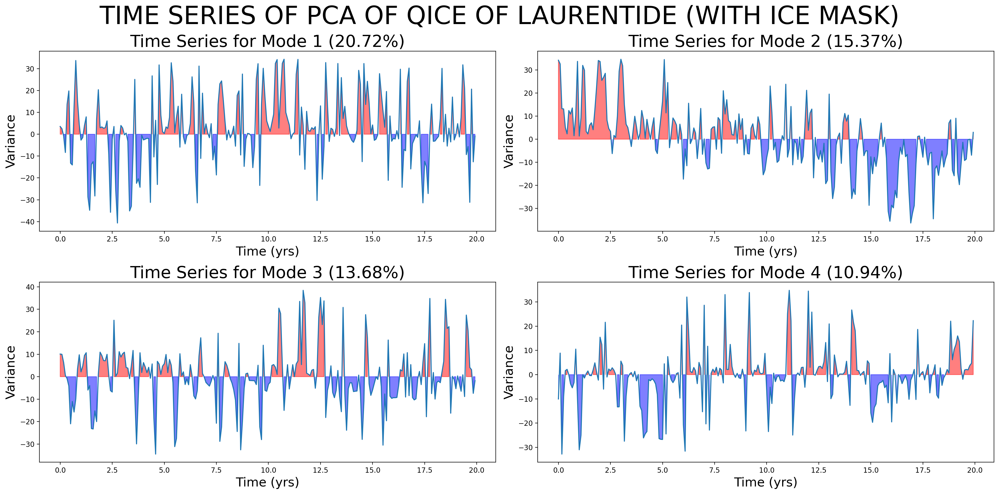

______________
PLOTTING PCs


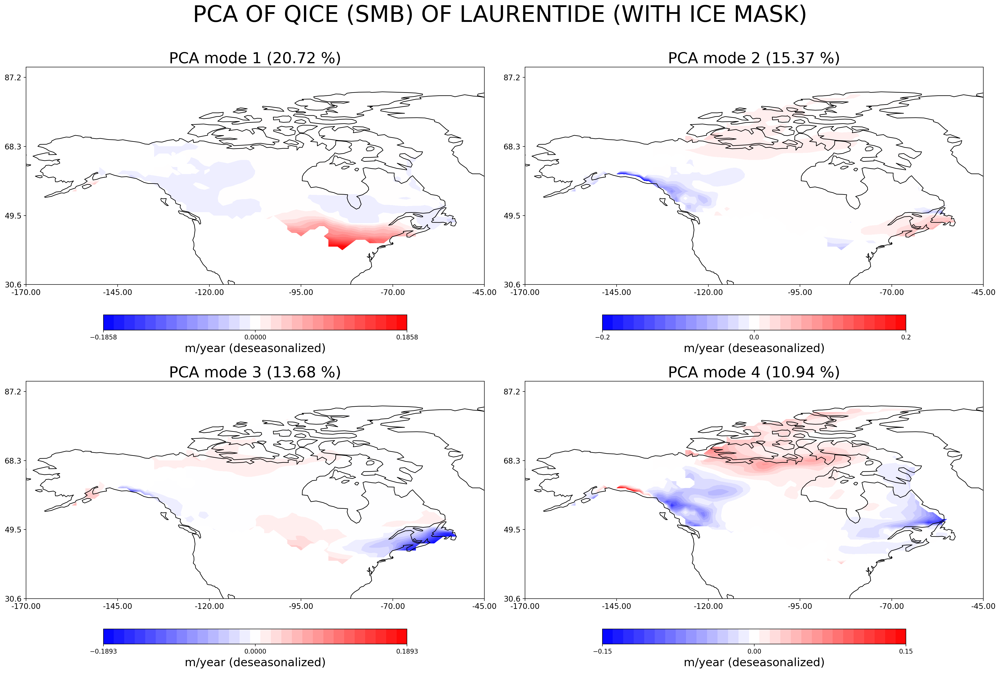

In [11]:
print("______________")
print("PROCESSING DATA")
smb_100_ice = preprocess_laurentide(smb_all, create_ice_mask(smb_all))
print("______________")
print("CONVERTING TO 2D")
smb100_X_dimensional, smb100_im, smb100_jm, smb100_long_length, smb100_lat_length = nans_3d_to_2d(smb_100_ice)
print("______________")
print("DOING PCA")
smb100_eigenvalues, smb100_V, smb100_X = pca(smb100_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_smb_100 = plot_eigen(smb100_eigenvalues, "QICE (with ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(smb100_V, smb100_X, 4, "TIME SERIES OF PCA OF QICE OF LAURENTIDE (WITH ICE MASK)", perc_smb_100)
print("______________")
print("PLOTTING PCs")
smb100_PCAs = nans_2d_to_3d(smb100_V, smb100_long_length, smb100_lat_length, smb100_im, smb100_jm)
data_smb_100 ={
    'reshaped_pca': smb100_PCAs,
    'original': smb_100_ice,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        1:.2,
        3:.15
    },
    'perc': perc_smb_100
}

plot_pcs(data_smb_100, 4, "PCA OF QICE (SMB) OF LAURENTIDE (WITH ICE MASK)")

## QICE_MELT

In [13]:
qice_melt_all

<xarray.DataArray 'QICE_MELT' (time: 240, lat: 192, lon: 288)> Size: 53MB
[13271040 values with dtype=float32]
Coordinates:
  * lon      (lon) float32 1kB 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * lat      (lat) float32 768B -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * time     (time) object 2kB 0001-02-01 00:00:00 ... 0021-01-01 00:00:00
Attributes:
    long_name:     ice melt
    units:         mm/s
    cell_methods:  time: mean

### NO ICE MASK

______________
PROCESSING DATA
converting data to m/s
deseasonalizing data
confirming the shape is still the same (original, new) (240, 192, 288) (240, 192, 288)
slicing data
______________
CONVERTING TO 2D
time 240 lat 64 long 101
finished finding nans
total nans 4014
up through 0
up through 50
up through 100
up through 150
up through 200
X shape (2450, 240)
______________
DOING PCA
covariance matrix shape (2450, 2450)
we calculated the first  10  evals
______________
PLOTTING EVALS


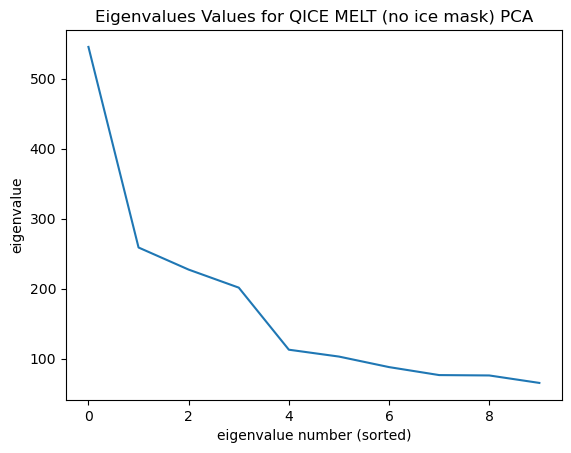

1 variance explained: 31.06%
2 variance explained: 14.74%
3 variance explained: 12.95%
4 variance explained: 11.48%
______________
PLOTTING TIME


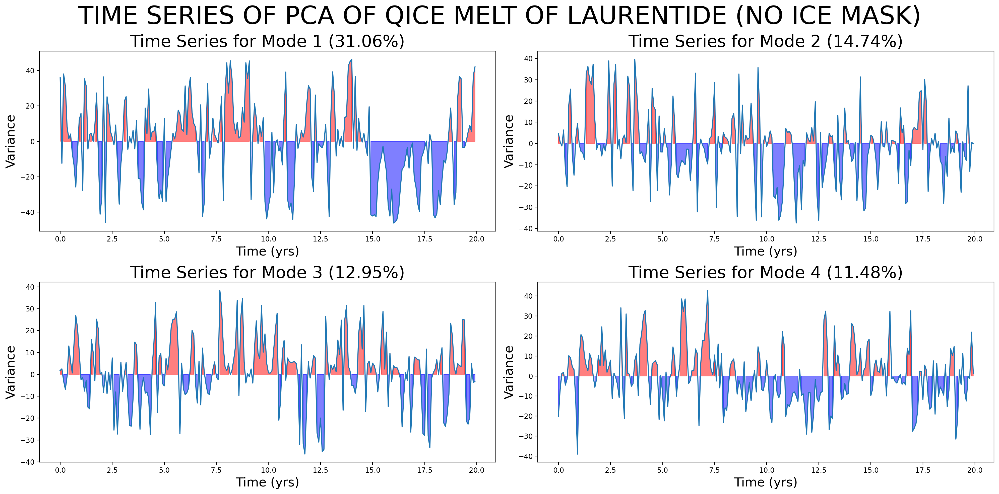

______________
PLOTTING PCs


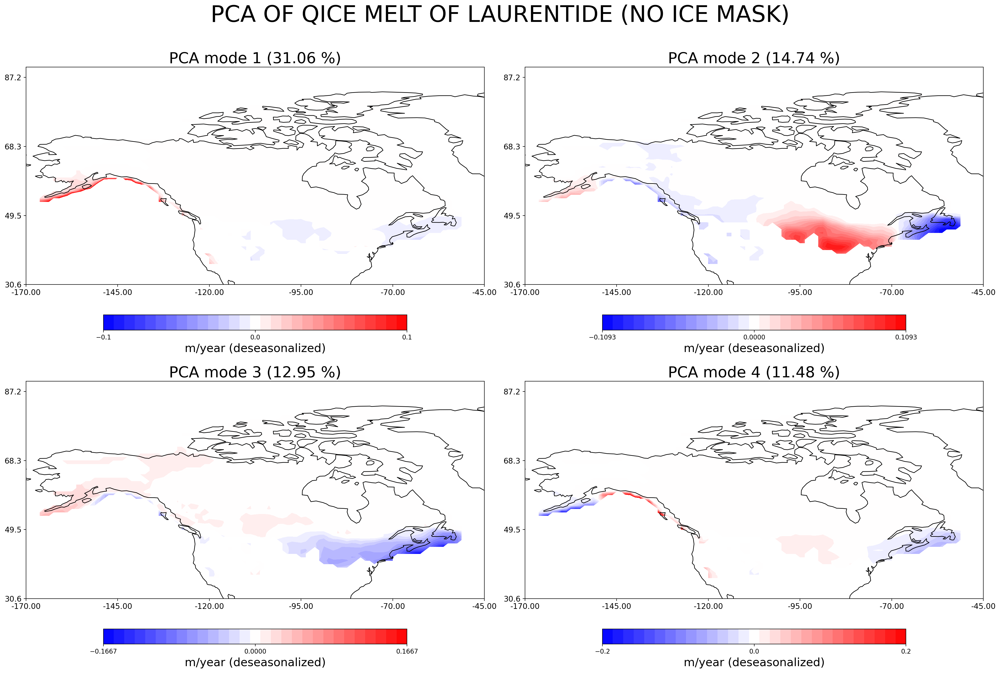

In [14]:
print("______________")
print("PROCESSING DATA")
qice_melt_processed = preprocess_laurentide(qice_melt_all)
print("______________")
print("CONVERTING TO 2D")
qice_melt_X_dimensional, qice_melt_im, qice_melt_jm, qice_melt_long_length, qice_melt_lat_length = nans_3d_to_2d(qice_melt_processed)
print("______________")
print("DOING PCA")
qice_melt_eigenvalues, qice_melt_V, qice_melt_X = pca(qice_melt_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_qice_melt = plot_eigen(qice_melt_eigenvalues, "QICE MELT (no ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(qice_melt_V, qice_melt_X, 4, "TIME SERIES OF PCA OF QICE MELT OF LAURENTIDE (NO ICE MASK)", perc_qice_melt)
print("______________")
print("PLOTTING PCs")
qice_melt_PCAs = nans_2d_to_3d(qice_melt_V, qice_melt_long_length, qice_melt_lat_length, qice_melt_im, qice_melt_jm)
data_melt ={
    'reshaped_pca': qice_melt_PCAs,
    'original': qice_melt_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0:.1,
        3:.2
    },
    'perc': perc_qice_melt
}

plot_pcs(data_melt, 4, "PCA OF QICE MELT OF LAURENTIDE (NO ICE MASK)")

### WITH ICE MASK

______________
PROCESSING DATA
converting data to m/s
deseasonalizing data
confirming the shape is still the same (original, new) (240, 192, 288) (240, 192, 288)
adding ice mask
slicing data
______________
CONVERTING TO 2D
time 240 lat 64 long 101
finished finding nans
total nans 4577
up through 0
up through 50
up through 100
up through 150
up through 200
X shape (1887, 240)
______________
DOING PCA
covariance matrix shape (1887, 1887)
we calculated the first  10  evals
______________
PLOTTING EVALS


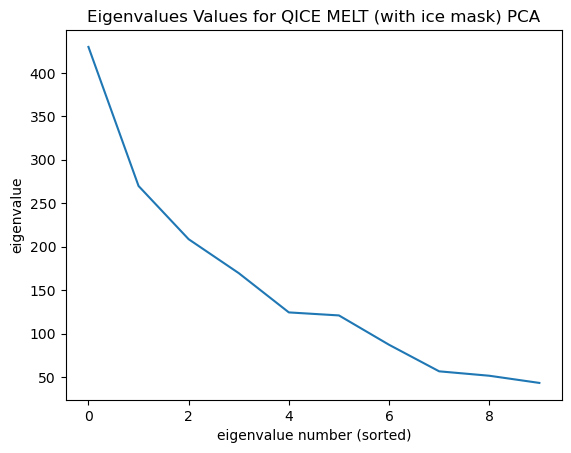

1 variance explained: 27.53%
2 variance explained: 17.28%
3 variance explained: 13.36%
4 variance explained: 10.86%
______________
PLOTTING TIME


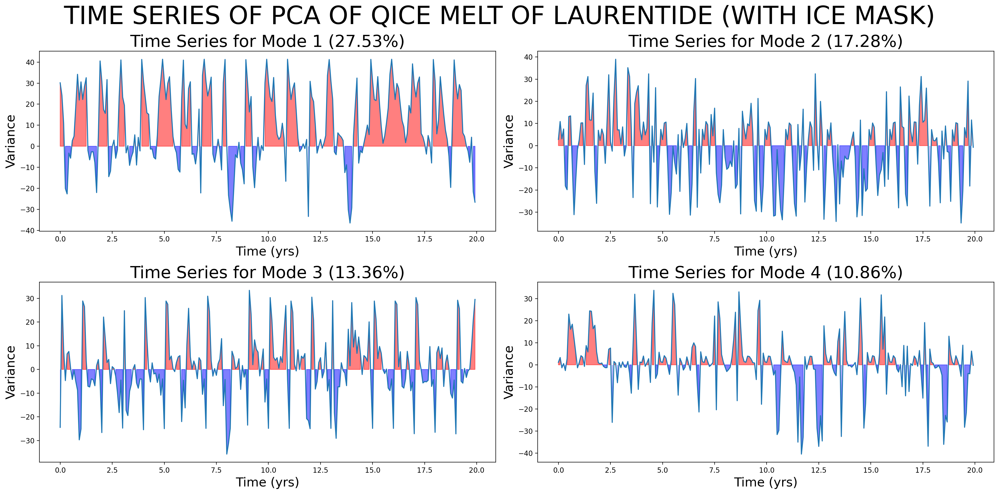

______________
PLOTTING PCs


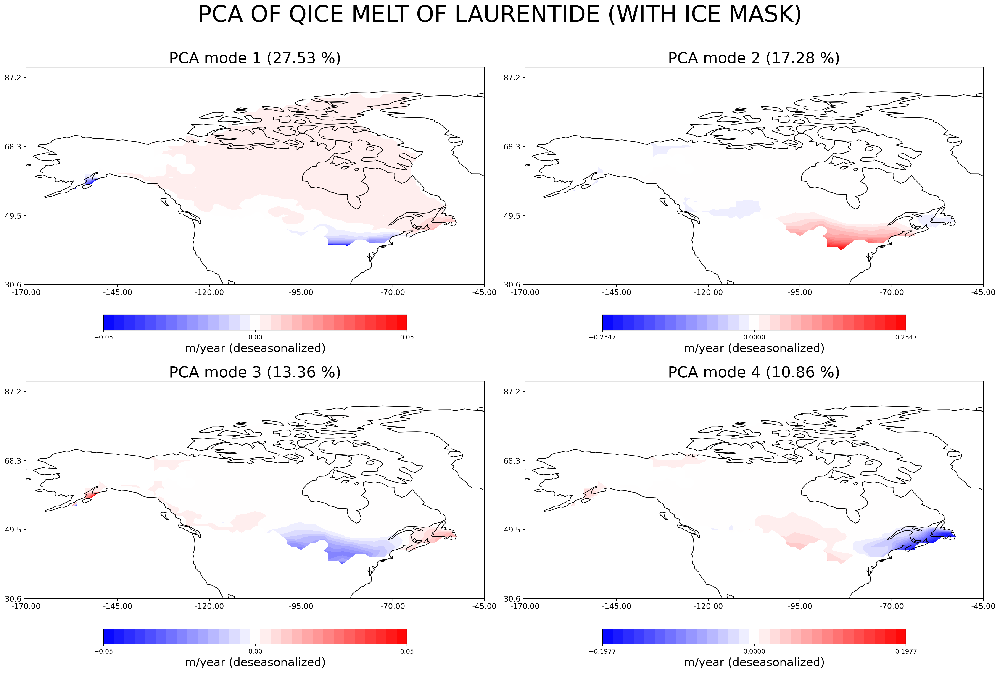

In [15]:
print("______________")
print("PROCESSING DATA")
qice_melt_100_processed = preprocess_laurentide(qice_melt_all, create_ice_mask(qice_melt_all))
print("______________")
print("CONVERTING TO 2D")
qice_melt_100_X_dimensional, qice_melt_100_im, qice_melt_100_jm, qice_melt_100_long_length, qice_melt_100_lat_length = nans_3d_to_2d(qice_melt_100_processed)
print("______________")
print("DOING PCA")
qice_melt_100_eigenvalues, qice_melt_100_V, qice_melt_100_X = pca(qice_melt_100_X_dimensional, 10)
print("______________")
print("PLOTTING EVALS")
perc_qice_melt_100 = plot_eigen(qice_melt_100_eigenvalues, "QICE MELT (with ice mask)")
print("______________")
print("PLOTTING TIME")
plot_time_series(qice_melt_100_V, qice_melt_100_X, 4, "TIME SERIES OF PCA OF QICE MELT OF LAURENTIDE (WITH ICE MASK)", perc_qice_melt_100)
print("______________")
print("PLOTTING PCs")
qice_melt_100_PCAs = nans_2d_to_3d(qice_melt_100_V, qice_melt_100_long_length, qice_melt_100_lat_length, qice_melt_100_im, qice_melt_100_jm)

data_melt_100 ={
    'reshaped_pca': qice_melt_100_PCAs,
    'original': qice_melt_100_processed,
    'label': "m/year (deseasonalized)",
    'shift': 360,
    'l_override': {
        0:.05,
        2:.05
    },
    'perc': perc_qice_melt_100
}

plot_pcs(data_melt_100, 4, "PCA OF QICE MELT OF LAURENTIDE (WITH ICE MASK)")
